# Clothes2Person

## Datasets:
https://github.com/shadow2496/VITON-HD?tab=readme-ov-file
11k pairs, with face (only lower body clothes, full body shot)
2k pairs, with face (only lower body clothes, full body shot)
datasource zalando

- 9k lower body (unfortunately only lower part of face visible (anonymized))
- 15k upper body (unfortunately only lower part of face visible (anonymized)) 
- 29k upper body (unfortunately only lower part of face visible (anonymized)) 
data source YOOX NET-A-PORTER


We use all data for training and use some new sampels for validation:
In-distribution Images from Zalando from the NEW tab (which should ensure these are new designs/ clothes the model has never seen)
Out of distribution images from Uniqlo from the NEW tab

## ControlNet
The ControlNet architecture (https://arxiv.org/pdf/2302.05543):
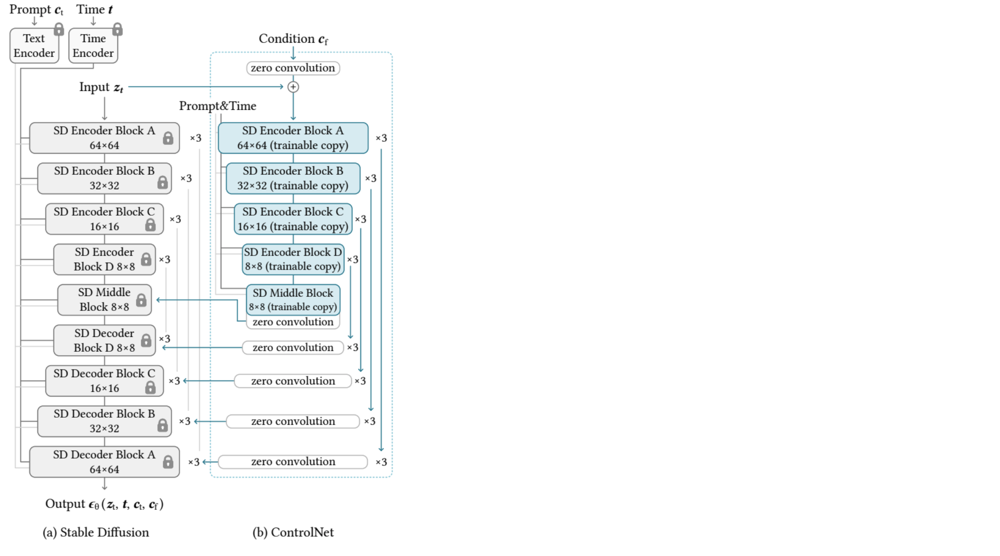
<br><br>
The main idea of the ControlNet is to include a secondary input in addition to the main input for any model F. 
Then a frozen, locked, F(x, theta), and a copy of F(x, theta) (copy of the pretrained weights) are finetuned in conjunction to calculate y.
The layerwise activations of the copy are added through 1x1 convolutions to the main model. These convolutional layers are initialized at 0 (opposed to randomly gaussian).
Thus initially, the whole model will compute using only F(x, theta), without the copy. This idea stabilizes the conditional finetuning approach: The weights of the initial F always stay locked and only the copied weights are finetuned in conjunction with the 1x1 convolutions:
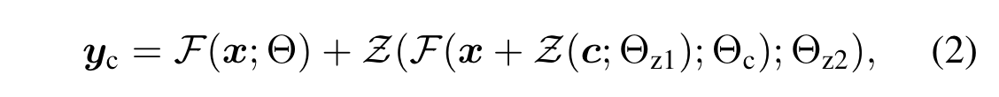

The authors apply the architecture to the Stable Diffusion architecture. In detail, only to the encoder and the middle part of U-Net component, which denoises the latents, are copied. The duplicated encoder and middle part of the U-Net are added through skip connections with 1x1 convolutions to the middle part and decoder of the original U-Net. While the main U-Net is conditioned on the timestep and the encoded prompt, the new part which is finetuned can be conditioned on a image embedding C_f which is obtained by downscaling a conditional image by a small convolutional component with four layers from 512x512 to the size of the U-Net latents, 64x64. 

Working applications of ControlNet today are similar to the apple example (further below), where the model is conditioned to follow a shape when composing a final image. Also, the main paper demonstrates how multiple conditions can be added through simple additions of the ControlNet outputs:
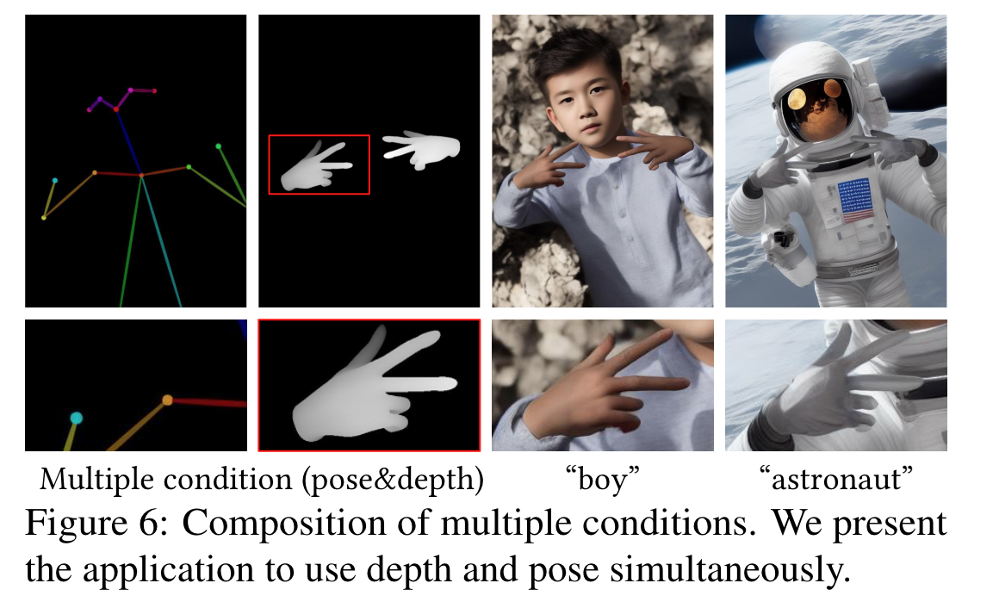

Some repository options for training ControlNet and insights by the author and community members:
 - https://github.com/lllyasviel/ControlNet<br>
    This is the official repository by one of the authors.
    Training is rather slow, but the author provides intuition on the training process.
    As observed over different training setups, ControlNet seems to have a point of convergence for the conventional ControlNet tasks like "depth-map2img", "lines2img" etc.: 
    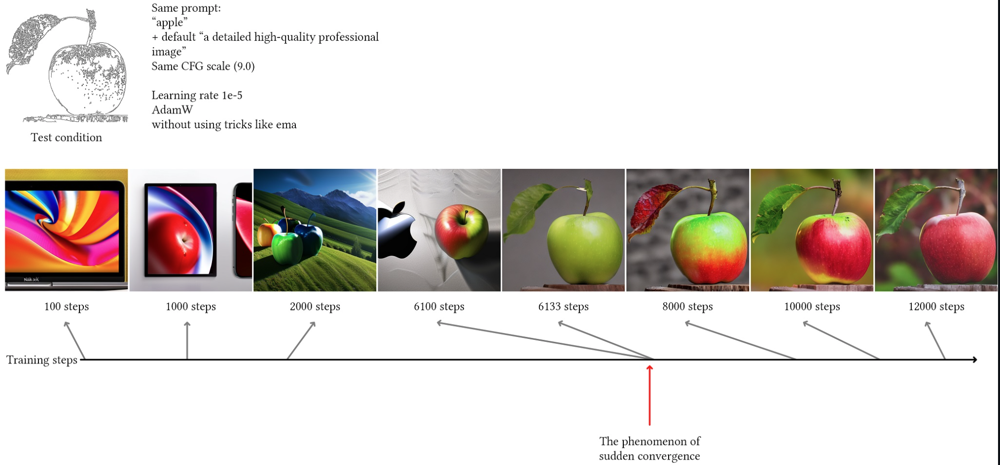 
    - According to the author instead of training much further beyond the point of convergence it is better to train with larger batch size and a similar step amount to achieve more stable results: In this case training for 6000 steps (to the point of convergence) with doubled batchsize is better than training for 12000 steps with the original batch size (https://github.com/lllyasviel/ControlNet/issues/93#issuecomment-1437715272).
    - The original paper replaces the text prompt for an image with 50% probability with an empty string. They state it helps the model to become independent and to learn semantics from the conditioning image. 
    - Experiments of Gerold Meisinger, who seems to be an active member of the ControlNet community, confirm how prompt dropping can increase the model's quality: https://github.com/lllyasviel/ControlNet/discussions/318#discussioncomment-7202122. He also confirms experimentally that additional training after point of convergence only "cycles through styles" but increased batch size increases the model's output quality.
    - Dataset sizes range from 50k to 200k and they state that training is robust with <50k dataset size (on their training objectives).
 - https://github.com/huggingface/diffusers <br>
    Huggingface provides a controlnet implementation and tutorial https://huggingface.co/docs/diffusers/training/controlnet. 
    The script can be run using the Huggingface/accelerate library which implements lower precision training and multi-gpu support.


## Data Preprocessing
### Merging Viton HD and Dresscode datasets
We hope that the combination of both datasets will help the model to create higher quality output:
- The Viton HD lacks lower body examples, which the Dresscode dataset provides.
- The Dresscode datasets model faces are cut halfway (possibly for anonymization purposes) which the Viton HD dataset provides in full shot.

One strategy to prevent the model from associating spurious information from the clothes images with the specifics of both datasets respectively (e.g. face is (not) cut off), is to include these facts through the clip encoder through text.
- Therefore, the model can learn to associate the fact that the face is (not) cut of with the text "face (not) in frame". Since we desire the face to be in frame, during inference we can use the appropriate text.
- Similarly, describing the output image with text, except for the clothing which is supplied as input image, could help the model to learn associations more appropriately. This is one variant we experiment with. Text descriptions can be added to the dataset with OpenAI's BLIP or CLIP

In [50]:
from PIL import Image
import os 
import pandas as pd  
import shutil 
from tqdm.auto import tqdm
dataset_dir = './dataset'
os.makedirs(dataset_dir, exist_ok=True)
os.makedirs(dataset_dir+'/clothes', exist_ok=True)
os.makedirs(dataset_dir+'/persons', exist_ok=True)

# test_pairs = pd.read_csv('zalando-hd-resized/test_pairs.txt', delimiter=' ', header=None)
# test_pairs.columns = ['clothes', 'persons']

# train_pairs = pd.read_csv('zalando-hd-resized/train_pairs.txt', delimiter=' ', header=None)
# test_pairs.columns = ['clothes', 'persons']


# all_pairs = pd.concat([test_pairs, train_pairs])
# # conflicts?
# print('No conflicts:')
# print(len(all_pairs) == len(set(all_pairs[0].values)) and len(all_pairs) == len(set(all_pairs[1].values)))

for file in tqdm(os.listdir('zalando-hd-resized/train/cloth')):
    if file.endswith('.jpg'):
        shutil.copy('zalando-hd-resized/train/cloth/'+file, dataset_dir+'/clothes/'+'vitonhdtrain_upperbody_'+file)

for file in tqdm(os.listdir('zalando-hd-resized/train/image')):
    if file.endswith('.jpg'):
        shutil.copy('zalando-hd-resized/train/image/'+file, dataset_dir+'/persons/'+'vitonhdtrain_upperbody_'+file)

for file in tqdm(os.listdir('zalando-hd-resized/test/cloth')):
    if file.endswith('.jpg'):
        shutil.copy('zalando-hd-resized/test/cloth/'+file, dataset_dir+'/clothes/'+'vitonhdtest_upperbody_'+file)

for file in tqdm(os.listdir('zalando-hd-resized/test/image')):
    if file.endswith('.jpg'):
        shutil.copy('zalando-hd-resized/test/image/'+file, dataset_dir+'/persons/'+'vitonhdtest_upperbody_'+file)


100%|██████████| 2032/2032 [00:01<00:00, 1876.72it/s]


In [51]:
# check if all files are copied
set(os.listdir('dataset/clothes')) == set(os.listdir('dataset/persons')) 
print('Number of pairs:', len(os.listdir('dataset/clothes')))

Number of pairs: 13679


In [52]:
# DressCode, check for each base name there are two iamges
counts = {}
for path in ['DressCode/dresses/images', 'DressCode/lower_body/images','DressCode/upper_body/images']:
    print(path)
    for p in os.listdir(path+'/'):
        ps = p.split('_')[0]
        if ps not in counts:
            counts[ps] = 1
        else:
            counts[ps] = 2 
    for k in counts:
        if counts[k] != 2:
            print(k) 


DressCode/dresses/images
DressCode/lower_body/images
DressCode/upper_body/images


In [53]:
# DressCode, check for each base name there are two images and copy the images to the dataset
for path in ['DressCode/dresses/images', 'DressCode/lower_body/images','DressCode/upper_body/images']:
    print(path)
    for p in tqdm(os.listdir(path+'/')):
        ps = p.split('_')[0]

        is_clothing = p.split('_')[1]
        type_ = path.split('/')[1]
        type_ = type_.replace('_','')
        if is_clothing =='1.jpg':
            shutil.copy(path+'/'+p, dataset_dir+'/clothes/'+'dresscode_'+type_+'_'+ps+'.jpg')
        elif is_clothing =='0.jpg':
            shutil.copy(path+'/'+p, dataset_dir+'/persons/'+'dresscode_'+type_+'_'+ps+'.jpg')
        else:
            raise ValueError('Unknown type')

DressCode/dresses/images


100%|██████████| 58956/58956 [00:32<00:00, 1816.58it/s]


DressCode/lower_body/images


100%|██████████| 17902/17902 [00:10<00:00, 1761.35it/s]


DressCode/upper_body/images


100%|██████████| 30726/30726 [00:17<00:00, 1719.01it/s]


In [94]:
# check if all files are copied
set(os.listdir('dataset/clothes')) == set(os.listdir('dataset/persons')) 
print('Number of pairs:', len(os.listdir('dataset/clothes')))

Number of pairs: 67471


In [ ]:
# Best inference settings are provided by the author https://civitai.com/models/25694/epicrealism

# Prompt: simple explanation of the image (try first without extra keywords)
# Negative: "cartoon, painting, illustration, (worst quality, low quality, normal quality:2)"
# Steps: >20 (if image has errors or artefacts use higher Steps)
# CFG Scale: 5 (higher config scale can lose realism, depends on prompt, sampler and Steps)
# Sampler: Any Sampler (SDE, DPM-Sampler will result in more realism)
# Size: 512x768 or 768x512
# Hires upscaler: 4x_NMKD-Superscale-SP_178000_G (Denoising: 0.35, Upscale: 2x)

### Resizing and creating DataLoader

Images need to be resized to multiples of 64. 
Since standard Stable Diffusion (SD) sizes are 512x512 and 768x512, we resize to 768x512 from 1024x768. <br>
The image is resized to match the height of 768 and the left and right are cut to match the smaller width of 512.

In [ ]:
import cv2

ratios = {}
for dir in ['dataset/clothes', 'dataset/persons']:
    for img_name in tqdm(os.listdir(dir)):
        img_path = os.path.join(dir, img_name)
        img = cv2.imread(img_path)
        # ratio = img.shape[1] / img.shape[0]
        reso_name = str(img.shape[0])+'x'+str(img.shape[1])
        if reso_name not in ratios:
            ratios[reso_name] = 1
        else:
            ratios[reso_name] += 1
        # print(ratio)
        

In [29]:
ratios

{'1024x768': 134942}

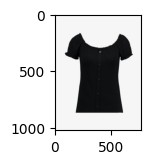

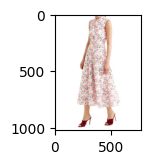

In [83]:
import cv2
vitionhd_sample = cv2.imread('dataset/clothes/vitonhdtrain_upperbody_14298_00.jpg')
dresscode_sample = cv2.imread('dataset/persons/dresscode_dresses_020735.jpg')
# show image, in ipython output
# cv2.imshow('image', img)

from matplotlib import pyplot as plt
import numpy as np
import cv2
def show_image(img, size=(1.5, 1.5)):
    plt.figure(figsize=size)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

show_image(vitionhd_sample)
show_image(dresscode_sample)

Height: 768, width:  576.0
Resized image openCV


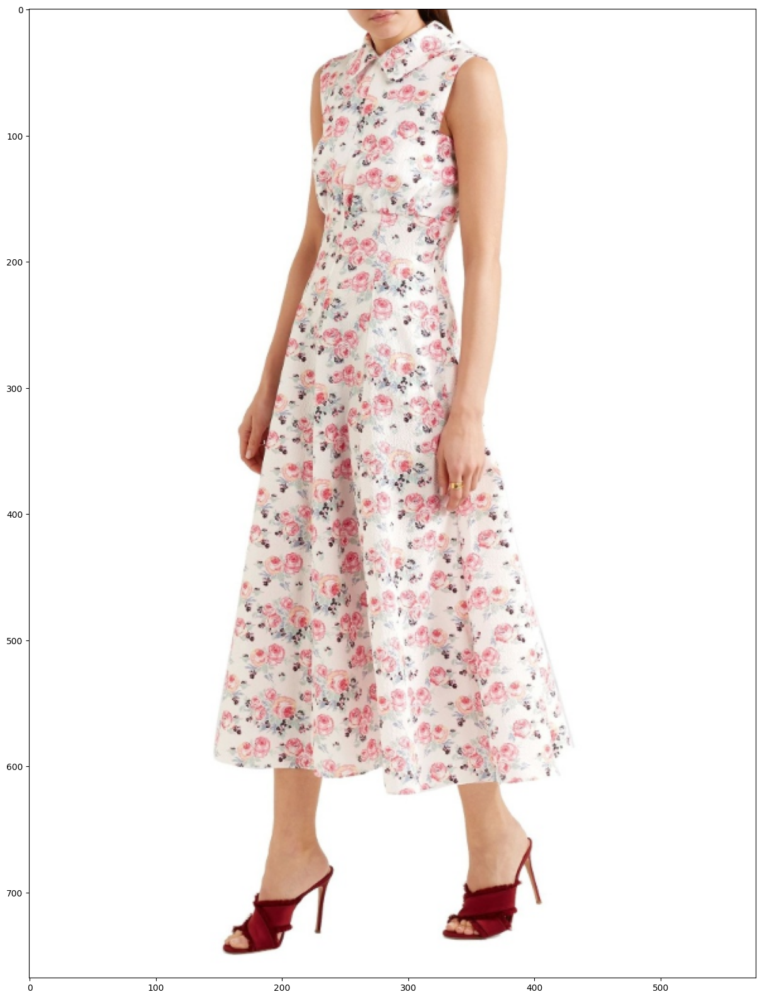

Resized image PIL


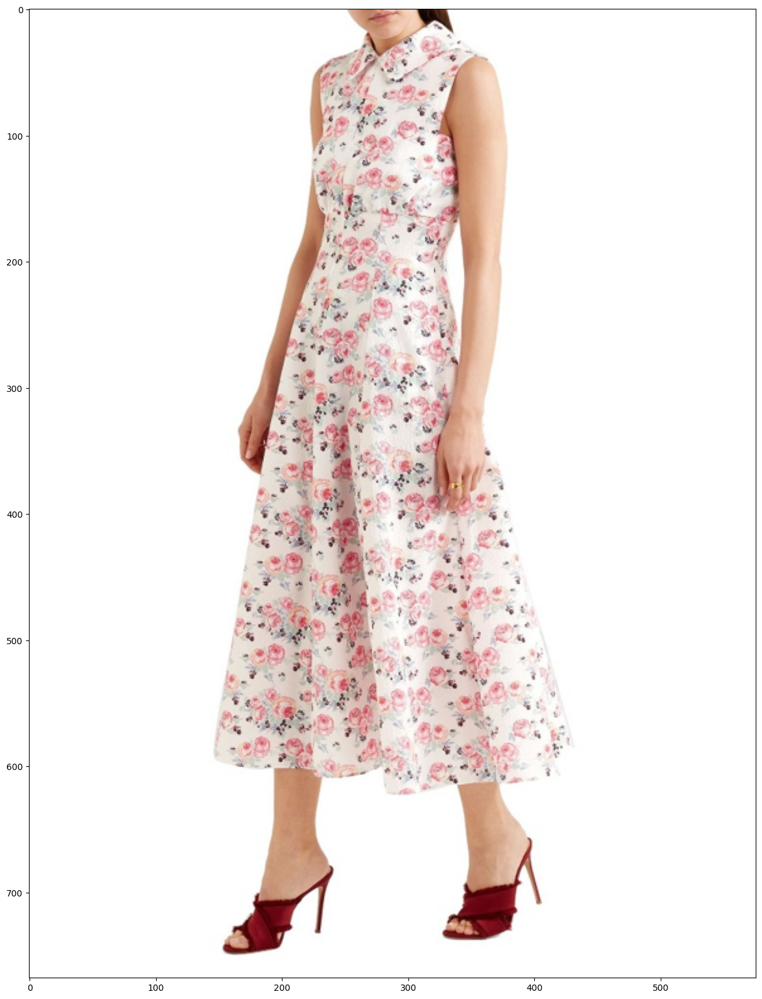

Center pixel 288
Resized image with width 512
Cropped image


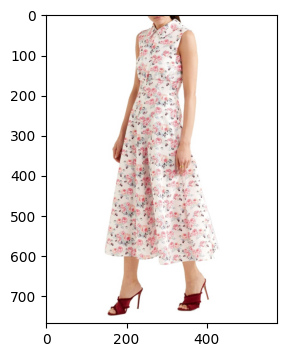

-->


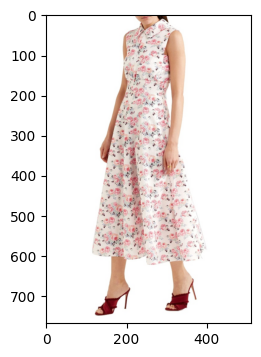

Width: 512 Height: 768


In [91]:
# using PIL instead of open cv for resizing, the edges seem less rough
from PIL import Image

img = dresscode_sample
width, height = img.shape[1], img.shape[0]
assert width == 768 and height == 1024
width = (768/1024)*768
print('Height: 768, width: ',width)
img = cv2.resize(dresscode_sample, (int(width), 768))
print('Resized image openCV')
show_image(img, size=(20, 20))

# same with PIL
img = Image.open('dataset/persons/dresscode_dresses_020735.jpg')
img = img.resize((int(width), 768))
print('Resized image PIL')
show_image(np.array(img)[:,:,::-1], size=(20, 20))

center_x = img.width//2
print('Center pixel', center_x)
print('Resized image with width 512')
cropped_img = img.crop((center_x-256, 0, center_x+256, 768))
print('Cropped image')
show_image(np.array(img)[:,:,::-1], size=(4, 4))
print('-->')
show_image(np.array(cropped_img)[:,:,::-1], size=(4, 4))
print('Width:', cropped_img.width, 'Height:', cropped_img.height)


In [96]:
# resize images
input_dirs = ['dataset/clothes', 'dataset/persons']
temp_dirs = ['dataset/temp_clothes', 'dataset/temp_persons']

for temp_dir in temp_dirs:
    os.makedirs(temp_dir, exist_ok=True)

for input_dir, temp_dir in zip(input_dirs, temp_dirs):
    for filename in tqdm(os.listdir(input_dir)):
    
        file_path = input_dir+'/'+ filename
        img = Image.open(file_path)
        width, height = img.size
        assert width == 768 and height == 1024
        width = (768/1024)*768
        img = img.resize((int(width), 768))
        center_x = img.width // 2
        cropped_img = img.crop((center_x-256, 0, center_x+256, 768))
        cropped_img.save(temp_dir+'/'+filename)

for input_dir, temp_dir in zip(input_dirs, temp_dirs):
    old_dir = 'old_' + os.path.basename(input_dir)
    new_dir = os.path.basename(temp_dir).replace('temp_', '')

    os.rename(input_dir, 'dataset/'+old_dir)
    os.rename(temp_dir, 'dataset/'+new_dir)



100%|██████████| 67471/67471 [12:58<00:00, 86.66it/s]  


### Creating image captions
The captioning code is run on Kaggle, because inference for the best captions is slow, it is run on multiple accounts.
We modify the code and utilize threading in order to run inference in parallel on both gpus Kaggle provides. Maybe running two inferences on one GPU could speed up the process even further.

In [ ]:
start_at = 0
end_at = start_at+2000

In [ ]:
!pip install clip-interrogator==0.6.0 -q

In [ ]:
!unzip -q /kaggle/input/getcontrolnetcaptions/persons.iamazip -d ./ 

In [ ]:
import torch
num_devices = torch.cuda.device_count()
if torch.cuda.is_available():
    print(f"CUDA is available. Number of devices: {num_devices}")
    for i in range(num_devices):
        print(f"Device {i}: {torch.cuda.get_device_name(i)}")
else:
    print("CUDA is not available.")

CUDA is available. Number of devices: 2
Device 0: Tesla T4
Device 1: Tesla T4


In [ ]:
from clip_interrogator import Config, Interrogator
def new_init(self, config: Config):
    print('Overwrite')
    self.config = config
    self.device = config.device
    self.dtype = torch.float32 # torch.float16 if 'cuda' in self.device else torch.float32 # modified
    self.caption_offloaded = True
    self.clip_offloaded = True
    self.load_caption_model()
    self.load_clip_model()
        
        
Interrogator.__init__ = new_init

In [ ]:
import os
if os.path.exists('/kaggle/input/getcontrolnetcaptions/captions.csv'):
    !cp /kaggle/input/getcontrolnetcaptions/captions.csv /kaggle/working/

In [ ]:
config = Config(clip_model_name="ViT-L-14/openai", device='cpu', quiet=True)
ci = Interrogator(config)
del ci

In [ ]:
import os
import threading
import csv
from PIL import Image
from tqdm.notebook import tqdm

input_folder = "/kaggle/working/persons"
output_file = "/kaggle/working/captions.csv"

device_ids = [0, 1] 
lock = threading.Lock()
images = [f for f in os.listdir(input_folder) if f.lower().endswith(('jpg', 'jpeg'))]

# Create the CSV file with a header if it doesn't exist
if not os.path.exists(output_file):
    with open(output_file, 'w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        writer.writerow(["filename", "caption"])
        
    
else:
    with open(output_file, 'r', newline='') as csvfile:
        reader = csv.reader(csvfile)
        next(reader)  
        csv_filenames = [row[0] for row in reader]
        print('Images before:',len(images))
        images = [f for f in images if f not in csv_filenames]
        print('After before:',len(images))
    

def process_images(images, device_id, progress_bar):
    config = Config(clip_model_name="ViT-L-14/openai", device='cuda:'+str(device_id), quiet=True)
    ci = Interrogator(config)

    for image_name in images:
        output_exists = False
        with lock:
            with open(output_file, 'r', newline='') as csvfile:
                reader = csv.reader(csvfile)
                if any(row[0] == image_name for row in reader):
                    output_exists = True
        if output_exists:
            progress_bar.update(1)
            continue

        image_path = os.path.join(input_folder, image_name)
        image = Image.open(image_path)
        caption = ci.interrogate(image)

        with lock:
            with open(output_file, 'a', newline='') as csvfile:
                writer = csv.writer(csvfile)
                writer.writerow([image_name, caption])
                csvfile.flush()
            progress_bar.update(1)

image_parts = [images[::2]+images[1::2], images[1::2]+images[::2]]
image_parts[0] = image_parts[0][start_at:end_at]
image_parts[1] = image_parts[1][start_at:end_at]

progress_bars = [tqdm(total=len(part), desc=f"GPU {i}") for i, part in enumerate(image_parts)]

threads = [
    threading.Thread(target=process_images, args=(image_parts[0], device_ids[0], progress_bars[0])),
    threading.Thread(target=process_images, args=(image_parts[1], device_ids[1], progress_bars[1]))
]

for thread in threads:
    thread.start()

for thread in threads:
    thread.join()

for progress_bar in progress_bars:
    progress_bar.close()

#### Processing the captions
1. Clean the captions
2. Remove parts of captions which correspond to the clothing item which will be supplied as image input to the ControlNet, such that the model learns to rely on the ControlNet input for the specific clothing. Since the captions are created using the image of the model wearing the clothes, now we can use CLIP to look only at image of the clothes and tell us which parts of the caption correspond to the clothes:
    1. Use spacy to split each single tag into semantic blocks
    2. Compare each block with the image of the clothing using CLIP to filter the appropriate ones out <br>
    (The alternative of applying an LLM is found to be impractical, because answers are not formatted correctly, or the model is imprecise in returning the captions and we have to filter for 60k images)
3. Enhance the tags: 
    - All model images contain a white background, add "stands in front of a white background" if not there yet.
    - dresscode images have the face cut of add "face visible", "face not visible"
    - add "C2PUpperBody", "C2PLowerBody", "C2PDress" for corresponding image types. 

##### Clean Captions

In [53]:
import pandas as pd
from tqdm import tqdm

def remove_non_ascii(s):
    # removed_characters = []
    ascii_string = ''.join(char for char in s if ord(char) < 128)
    # removed_characters = [char for char in s if ord(char) >= 128]
    # if removed_characters:
        # print(f"Removed non-ASCII characters: {' '.join(removed_characters)}")
    
    return ascii_string

captions = pd.read_csv('captions.csv')

def clean_caption(caption):
    ascii_caption = remove_non_ascii(caption)
    
    tags = [tag.strip() for tag in ascii_caption.split(',')]
    
    cleaned_tags = [tag for tag in tags if tag]
    
    cleaned_caption = ', '.join(cleaned_tags)
    
    return cleaned_caption

tqdm.pandas(desc="Cleaning captions")
captions['caption'] = captions['caption'].progress_apply(clean_caption)

Cleaning captions: 100%|██████████| 67471/67471 [00:29<00:00, 2273.97it/s]


In [57]:
captions['caption'][0]

'a woman in a blue and orange dress with a clutch, refracted line and sparkles, bold graphics, ultramarine metal, gown, suki, very tall and slender, barcodes, gliter, round-cropped, flat texture, galactic, palladium, product image'

##### Inspect Captions

Filename: dresscode_dresses_033203.jpg


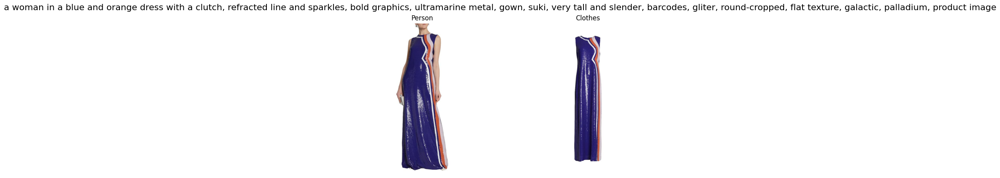


Filename: vitonhdtrain_upperbody_09726_00.jpg


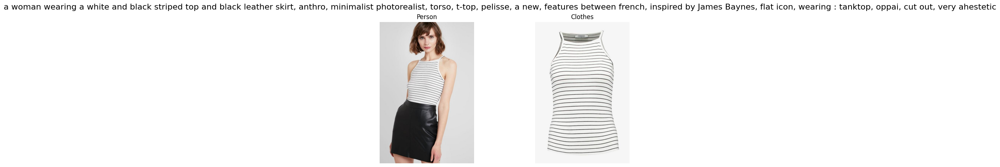


Filename: vitonhdtrain_upperbody_08957_00.jpg


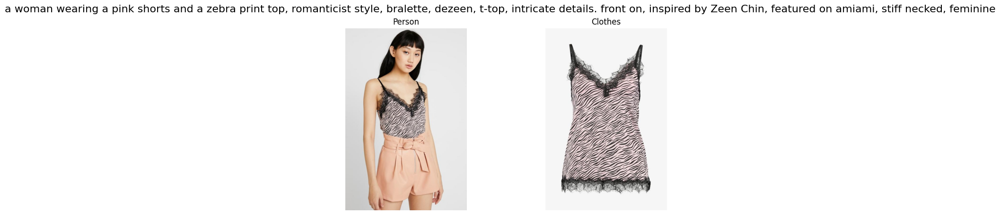


Filename: dresscode_upperbody_048951.jpg


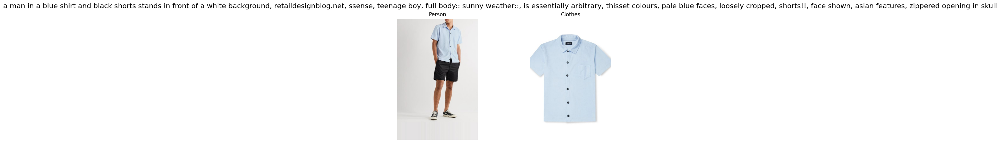


Filename: dresscode_upperbody_012135.jpg


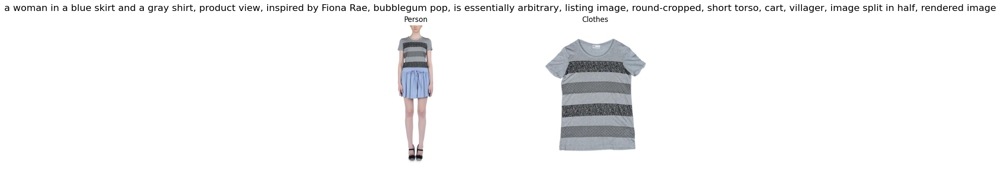

In [37]:
import os
import matplotlib.pyplot as plt
from PIL import Image
def display_with_caption(image_path, caption, filtered_captions=''):
    

    img1 = Image.open('dataset/persons/' + image_path)
    img2 = Image.open('dataset/clothes/' + image_path)

    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(img1)
    ax[0].set_title('Person')
    ax[0].axis('off')
    ax[1].imshow(img2)
    ax[1].set_title('Clothes')
    ax[1].axis('off')
    plt.suptitle(caption, fontsize=16)
    plt.show()
    print(filtered_captions)


for i in range(5):
    print("Filename:", captions['filename'].iloc[i])
    display_with_caption(captions['filename'].iloc[i], captions['caption'].iloc[i])

In [4]:
# import ollama
# chat = lambda message: ollama.chat(model='phi3:14b-instruct', messages=[{'role': 'system', 'content': message}])['message']['content']
# chat('How are you')

In [ ]:
!pip install --upgrade pip -q
!pip install numpy==1.26.4 spacy==3.7.2 -q # fix not numpy 2.0 
!python -m spacy download en_core_web_sm -q


##### Remove parts of captions corresponding to the clothing item

In [58]:
import spacy

# Load the English language model
nlp = spacy.load("en_core_web_sm")
def get_chunks(text):
    doc = nlp(text)
    chunks = []
    current_chunk = []
    before = []
    prev_adp = None
    this_adp = None

    # preprocess text, when there is a "-" we take it as one word, e.g. "round-cropped" and type is of second word
    doc = [{'text': token.text, 'pos_': token.pos_} for token in doc]
    new_doc = []
    word_counter = 0
    
    for i, token in enumerate(doc):
        if i<word_counter:
            continue
        if len(doc)>i+2 and doc[i+1]['text'] == '-':
            new_doc.append({'text': doc[i]['text']+doc[i+1]['text']+doc[i+2]['text'], 'pos_': doc[i+2]['pos_']})
            word_counter += 3
        else:
            word_counter += 1
           
            new_doc.append({'text': token['text'], 'pos_': token['pos_']})

    doc = new_doc
    for i,token in enumerate(doc):
        # print(token.pos_,token.text)
        if token['pos_'] in ['DET', 'ADJ', 'NOUN' ,'PROPN']:
            current_chunk.append((token['pos_'],token['text']))
        else:
            if current_chunk:
                if before:
                    current_chunk = before + current_chunk
                    
                
                # ap = " ".join(current_chunk)
                ap = current_chunk
                if ('CCONJ', 'and') in before:
                    if prev_adp:
                        # ap = (prev_adp, ap)
                        ap.insert(0, ('prev_adp',prev_adp))
                chunks.append(ap)
                current_chunk = []
                before = []
                prev_adp = this_adp
                this_adp = None
            
            # if token.pos_ in ['ADP', 'CCONJ', 'VERB', 'PUNCT', 'VERB ROOT','ADV', 'AUX ROOT', 'AUX']:
            before.append((token['pos_'],token['text']))
            if token['pos_'] in ['ADP', 'VERB ROOT', 'VERB']:
                this_adp = token['text']
    
    if current_chunk:
        if before:
            # if 'and' in before:
                # if prev_adp:
                    # current_chunk.insert(0, prev_adp)
            
            current_chunk = before + current_chunk
        ap = current_chunk
        if ('CCONJ', 'and') in before:
            if prev_adp:
                # ap = (prev_adp, ap)
                ap.insert(0, ('prev_adp',prev_adp))
        chunks.append(ap)
    elif before: # edge case only non-'DET', 'ADJ', 'NOUN' ,'PROPN' etc.. E.g. text only "round-cropped".
        chunks.append(before)

    final_chunks = []
    for chunk in chunks:
        len_chunk = len(chunk)
        if len_chunk>=2 and chunk[-2][0] == 'ADJ' and chunk[-1][0] == 'ADJ':
            chunk[-1] = ('NOUN', chunk[-1][1])
        final_chunks.append(chunk)

    return final_chunks

chunks = get_chunks("a woman wearing a white dress and black sandals stands in front of a white background")
for chunk in chunks:
    print(chunk)

# chunks = get_chunks(captions['caption'].iloc[1].split(',')[0])
# for chunk in chunks:
#     print(chunk)

[('DET', 'a'), ('NOUN', 'woman')]
[('VERB', 'wearing'), ('DET', 'a'), ('ADJ', 'white'), ('NOUN', 'dress')]
[('prev_adp', 'wearing'), ('CCONJ', 'and'), ('ADJ', 'black'), ('NOUN', 'sandals')]
[('VERB', 'stands'), ('ADP', 'in'), ('NOUN', 'front')]
[('ADP', 'of'), ('DET', 'a'), ('ADJ', 'white'), ('NOUN', 'background')]


--> Simplified rule: When prev_adp in block and last block is filtered out, remove the CCONJ and leave the prev_adp, else the other way around: "a woman in a dress and black sandals" -> "a woman in black sandals"<br><br>
--> Simplified rule: Check whether two adjacent blocks have higher probability of corresponding to the image e.g. "in a dress", "in a dress with a floral pattern" to also remove the second block <br><br>
--> Simplified rule: when previous ends with 'ADJ' or 'ADV' or 'VERB ROOT' and next starts with CCONJ and ADJ -> join them e.g. "a blue and white dress" <> "a blue hat and white dress"

In [59]:
# Apply: --> Simplified rule: when previous ends with 'ADJ' or 'ADV' or 'VERB ROOT' and next starts with CCONJ and ADJ -> join them e.g. "a blue | and white dress" <> "a blue hat | and white dress"
def chunk_with_rules(text):
    chunks = get_chunks(text)
    new_chunks = []
    last_was_joined_with_this = False
    for i in range(len(chunks)-1):
        if last_was_joined_with_this:
            last_was_joined_with_this = False
            continue
        current_chunk = chunks[i]
        next_chunk = chunks[i + 1]
        if current_chunk[-1][0] in ['ADJ','ADV','VERB ROOT'] and (next_chunk[0][0] == 'CCONJ'  or next_chunk[0][0] =='prev_adp' and next_chunk[1][0] == 'CCONJ'  ):
            if next_chunk[0][0] == 'prev_adp':
                new_chunks.append(current_chunk + next_chunk[1:])
                # then we have to add to the second following chunk the previous adp
                if i+2 < len(chunks):
                    chunks[i+2].insert(0, next_chunk[0])
            else:
                new_chunks.append(current_chunk + next_chunk)
            last_was_joined_with_this = True
        else:
            last_was_joined_with_this = False
            new_chunks.append(current_chunk)
    try:
        if not last_was_joined_with_this:
            new_chunks.append(chunks[-1])
    except BaseException as e:
        print(e, chunks, text)
    return new_chunks

Similarity is learned in the CLIP paper using dot product, so we can use the logits directly to measure similarity between text and the image:<br>
logits = np.dot(I_e, T_e.T) * np.exp(t)

Observation:
When the clothing in the picture is described, the whole joined chunk has a higher logit.<br>
E.g. if the picture shows a woman wearing a black top with a v neck, this tag has higher logit than the tags "black top" and "v neck" individually.<br>
Conversely, if the tag is "a black top and blue pants", the logit for this joined chunk is lower than for the individual chunks.

What the code does:
0. Get chunks (a chunk is a subphrase of one tag. Tags are separated by ',')
1. Get the logits for each chunk and logits for joining two consecutive chunks
2. If the logit is higher than a threshold, remove the chunk
3. If the logit of the joined chunk is higher than the logit of each individual chunk and this joined junk has the highest logit for all joined chunks in which any of the two chunks occur, remove both chunks

In [45]:
# adapted from https://huggingface.co/docs/transformers/model_doc/clip
from PIL import Image
import requests
import torch

from transformers import CLIPProcessor, CLIPModel

# Load the CLIP model and processor
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
model.eval()

CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 512)
      (position_embedding): Embedding(77, 512)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=512, out_features=2048, bias=True)
            (fc2): Linear(in_features=2048, out_features=512, bias=True)
          )
          (layer_norm2): LayerNorm((512,), eps=1e-05,

  0%|          | 0/5 [00:00<?, ?it/s]



Filename: dresscode_dresses_033203.jpg
Captions: a woman in a blue and orange dress with a clutch, refracted line and sparkles, bold graphics, ultramarine metal, gown, suki, very tall and slender, barcodes, gliter, round-cropped, flat texture, galactic, palladium, product image


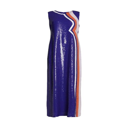

 20%|██        | 1/5 [00:00<00:01,  2.29it/s]


Remove all text with logits >= 23.8

Logits:
a woman                                            21.69
in a blue and orange dress                         24.37
in with a clutch                                   19.76
  refracted line                                   22.21
refracted and sparkles                             21.73
  bold graphics                                    20.32
  ultramarine metal                                24.92
  gown                                             26.12
  suki                                             21.49
  very tall and slender                            25.72
  barcodes                                         20.03
  gliter                                           22.89
  round-cropped                                    22.45
  flat texture                                     23.08
  galactic                                         22.49
  palladium                                        19.71
  product image                           

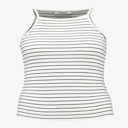

 40%|████      | 2/5 [00:00<00:00,  3.39it/s]


Remove all text with logits >= 23.8

Logits:
a woman                                            20.81
wearing a white and black striped top              29.77
wearing and black leather skirt                    15.67
  anthro                                           20.12
  minimalist photorealist                          21.77
  torso                                            24.38
  t-top                                            23.22
  pelisse                                          22.28
  a new                                            21.09
  features                                         21.42
between french                                     21.28
  inspired by James Baynes                         21.25
  flat icon                                        19.17
  wearing : tanktop                                27.02
  oppai                                            20.56
  cut out                                          23.56
  very ahestetic                          

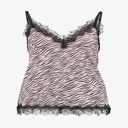


Remove all text with logits >= 23.8

Logits:
a woman                                            19.32
wearing a pink shorts                              20.23
wearing and a zebra print top                      28.49
  romanticist style                                21.41
  bralette                                         25.51
  dezeen                                           20.46
  t-top                                            21.94
  intricate details                                20.42
. front                                            22.28
on                                                 21.44
  inspired by Zeen Chin                            20.65
  featured on amiami                               20.40
  stiff necked                                     21.33
  feminine                                         21.92


 60%|██████    | 3/5 [00:00<00:00,  3.94it/s]


Joined chunk logits: 
wearing a pink shorts wearing and a zebra print top 27.85
  intricate details . front                        21.98
. front on                                         23.15

===> Final tag: a woman wearing a pink shorts, romanticist style, dezeen, t-top, intricate details.front on, inspired by Zeen Chin, featured on amiami, stiff necked, feminine


Filename: dresscode_upperbody_048951.jpg
Captions: a man in a blue shirt and black shorts stands in front of a white background, retaildesignblog.net, ssense, teenage boy, full body:: sunny weather::, is essentially arbitrary, thisset colours, pale blue faces, loosely cropped, shorts!!, face shown, asian features, zippered opening in skull


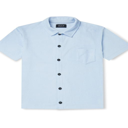


Remove all text with logits >= 23.8

Logits:
a man                                              20.86
in a blue shirt                                    25.27
in and black shorts                                16.01
stands in front                                    21.20
of a white background                              22.74
  retaildesignblog.net                             22.62
  ssense                                           24.61
  teenage boy                                      20.70
  full body                                        22.17
: : sunny weather                                  22.40
: :                                                20.85
  is essentially arbitrary                         20.27
  thisset colours                                  21.71
  pale blue                                        25.43
faces                                              17.62
  loosely cropped                                  21.75
  shorts ! !                              

 80%|████████  | 4/5 [00:01<00:00,  4.06it/s]


Joined chunk logits: 
in a blue shirt in and black shorts                24.25
in and black shorts stands in front                20.65
stands in front of a white background              23.52
  full body : : sunny weather                      22.68
: : sunny weather : :                              23.46
  pale blue faces                                  23.55
  face shown                                       20.16
  zippered opening in skull                        22.21

===> Final tag: a man in black shorts stands in front of a white background, retaildesignblog.net, teenage boy, full body : : sunny weather : :, is essentially arbitrary, thisset colours, faces, loosely cropped, shorts ! !, face shown, asian features, zippered opening in skull


Filename: dresscode_upperbody_012135.jpg
Captions: a woman in a blue skirt and a gray shirt, product view, inspired by Fiona Rae, bubblegum pop, is essentially arbitrary, listing image, round-cropped, short torso, cart, villager, image spli

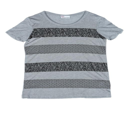


Remove all text with logits >= 23.8

Logits:
a woman                                            17.70
in a blue skirt                                    16.50
in and a gray shirt                                27.50
  product view                                     23.05
  inspired by Fiona Rae                            21.43
  bubblegum pop                                    16.82
  is essentially arbitrary                         20.41
  listing image                                    22.93
  round-cropped                                    23.62
  short torso                                      24.82
  cart                                             21.72
  villager                                         21.01
  image split                                      23.18
in half                                            22.10
  rendered image                                   22.49


100%|██████████| 5/5 [00:01<00:00,  3.92it/s]


Joined chunk logits: 
in a blue skirt in and a gray shirt                25.57
  image split in half                              22.13

===> Final tag: a woman in a blue skirt, product view, inspired by Fiona Rae, bubblegum pop, is essentially arbitrary, listing image, round-cropped, cart, villager, image split in half, rendered image


In [67]:
chunk_with_split_and_rules = lambda text: [chunk_with_rules(t) for t in text.split(',')]
print_ = True
import csv
from tqdm.auto import tqdm
# with open('clean_captions.csv', 'r', newline='') as csvfile:
#         reader = csv.reader(csvfile)
#         # next(reader)  # skip the header
#         files_captions_already_cleaned = set([row[0] for row in reader])

with open('clean_captions_s.csv', 'w+', newline='') as f:
    writer = csv.writer(f)
    writer.writerow(['filename', 'caption'])
    
    # for index in tqdm(range(captions['filename'].shape[0])):
        # if captions['filename'].iloc[index] in files_captions_already_cleaned:
        #     # continue
    for index in tqdm(range(5)):
        if print_:
            print("\n\nFilename:", captions['filename'].iloc[index])
            print('Captions:', captions['caption'].iloc[index])
        from PIL import Image
        img = Image.open('dataset/clothes/'+captions['filename'].iloc[index])
        chunks = chunk_with_split_and_rules(captions['caption'].iloc[index])
        all_chunks = [' '.join([m[1] for m in minichunk]) for chunk in chunks for minichunk in chunk]
        inputs = processor(text=all_chunks, images=img, return_tensors="pt", padding=True)
        with torch.no_grad():
            outputs = model(**inputs)
        logits_per_image = outputs.logits_per_image
        if print_:
            display(img.resize((128,128)))
        normal_chunk_dict = {}
        print('\nRemove all text with logits >= 23.8')
        print('\nLogits:')
        for i, chunk in enumerate(all_chunks):
            normal_chunk_dict[chunk] = logits_per_image[0][i]
            if print_:
                print(f"{chunk:<50} {logits_per_image[0][i]:.2f}")
        # make adjacent chunks into one
        adjacent_chunks = []
        adjacent_chunk_parts = []
        for chunk in chunks:
            last_chunk = ''
            for minichunk in chunk:
                if not('boy' in last_chunk or 'girl' in last_chunk or 'man' in last_chunk or 'woman' in last_chunk) and not last_chunk=='' and not minichunk[0][1] == '':
                    adjacent_chunks.append(last_chunk + ' '+ ' '.join([m[1] for m in minichunk]))
                    adjacent_chunk_parts.append((last_chunk, ' '.join([m[1] for m in minichunk])))
                last_chunk = ' '.join([m[1] for m in minichunk])
                
        if len(adjacent_chunks):
            inputs = processor(text=adjacent_chunks, images=img, return_tensors="pt", padding=True)
            with torch.no_grad():
                outputs = model(**inputs)
            logits_per_image = outputs.logits_per_image

        adj_chunk_dict = {}
        for i, chunk in enumerate(adjacent_chunks):
            adj_chunk_dict[chunk] = {'v':logits_per_image[0][i],'keys':adjacent_chunk_parts[i]}

        if print_:
            print('\nJoined chunk logits: ')
            for i, chunk in enumerate(adjacent_chunks):
                print(f"{chunk:<50} {logits_per_image[0][i]:.2f}")

        # removal of chunk logic:
        # remove every chunk v > 23.8
        adj_chunk_keys = list(adj_chunk_dict.keys())
        remove_chunks = set()
        remove_chunks_joined_keys = []
        threshold = 23.8
        for k, v in normal_chunk_dict.items():
            if k in remove_chunks or k == '':
                continue
            if v <threshold:
                continue 
            remove_chunks.add(k)
        # if the joined chunk (logit of two chunks joined) > 23.8, remove both chunks, but only when the joined logit is higher than the logit of each individual chunk
        # and only do this for the largest logit for each chunk
        for k, v in adj_chunk_dict.items():
            if v['v'] < threshold:
                continue
            k1, k2 = v['keys']
            bigger_keys = []
            if normal_chunk_dict[k1] < v['v']:
                bigger_keys.append(k1)
            if normal_chunk_dict[k2] < v['v']:
                bigger_keys.append(k2)
            if len(bigger_keys) < 2:
                continue
            
            is_biggest_logit_for_at_least_one = False
            for key in bigger_keys:
                keys_part_of2 = [ak for ak in adj_chunk_keys if k2 in ak]
                for k2_ in keys_part_of2:
                    if adj_chunk_dict[k2_]['v'] > v['v']:
                        break
                is_biggest_logit_for_at_least_one = True
                break
            if is_biggest_logit_for_at_least_one:
                remove_chunks.add(k1)
                remove_chunks.add(k2)
                remove_chunks_joined_keys.append(k1+' '+k2)
                remove_chunks_joined_keys.append(k2+' '+k1)

        
        all_tags = ''
        for chunk in chunks:
            last_was_removed = False
            single_tag = ''
            for minichunk in chunk:
                tag = ' '.join([m[1] for m in minichunk])
                if tag in remove_chunks:
                    last_was_removed = True
                elif last_was_removed:
                    last_was_removed = False
                    if minichunk[0][0] == 'prev_adp':
                        
                        temp_tag = minichunk[:1] + minichunk[2:]
                        tag = ' '.join([m[1] for m in temp_tag])
                    
                    if len(single_tag) > 2 and tag.strip(' ').startswith('. '):
                        # website
                        single_tag += tag.strip(' ')[0]+ tag.strip(' ')[2:]
                    else:
                        single_tag += ' '+tag.strip(' ')
                else:
                    last_was_removed = False
                    if minichunk[0][0] == 'prev_adp':
                        temp_tag = minichunk[1:]
                        tag = ' '.join([m[1] for m in temp_tag])
                    if len(single_tag) > 2 and tag.strip(' ').startswith('. '):
                        # website
                        single_tag += tag.strip(' ')[0]+ tag.strip(' ')[2:]
                    else:
                        single_tag += ' '+tag.strip(' ')
            if len(single_tag) > 0:
                all_tags += single_tag.strip(' ') +', '
                

        all_tags = all_tags[:-2]
        if print_:
            print('\n===> Final tag:', all_tags)
        
        # Write the final caption to the file
        writer.writerow([captions['filename'].iloc[index], all_tags])
        f.flush()


The whole tag filtering takes 5 hours, speedup by calling the model only once would have been possible.

We set the threshold at logits>23.8 after examining at 50 image. It is no perfect filter, e.g. especially for "white- and black tops" the logits are always low.
The captions would always start with "a ... wearing A and B". We especially made sure that when A is removed, the caption still says "a ... wearning B".

##### Enhancing the tags

For determining a good tag to add for each of the options below, https://haveibeentrained.com/ is used which uses the CLIP model as well as tags to find images. We chose the tags of which the resulting images depict what we wanted to describe.
For example the text "face cut off" did not return satisfactory results (people with cuts on their faces/ blood). Instead we use "lower part of face"
 Unfortunately https://rom1504.github.io/clip-retrieval/ which can be used to search the original LAION dataset by captions is not functional anymore.

In [87]:
import csv
import re
from transformers import CLIPTokenizer
from tqdm import tqdm

tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")
def check_prompt_length(prompt):
    tokens = tokenizer.encode(prompt)
    token_count = len(tokens)
    return token_count

# Function to enhance tags
counter, avg_dist = 0,[]
def enhance_tags_and_trim_to_75(filename, caption):
    global counter
    # Add white background if not present
    # # Add face visibility for dresscode images
    if filename.startswith('dresscode'):
        caption += ", lower part of face"

    if "background" not in caption.lower():
        caption += ", stands in front of a white background"
    
    
   
    
    if 'upperbody' in filename:
        caption = "C2PUpperBody, "+caption
    elif 'lowerbody' in filename:
        caption = "C2PLowerBody, "+caption
    elif 'dresses' in filename:
        caption = "C2PDress, "+caption
    
    # Check prompt length:
    flag = False
    dist =0
    while check_prompt_length(caption) > 75:
        dist +=1
        if flag == False:
            flag = True
            counter +=1
            print(counter, end='\r')
        caption_parts = caption.split(',')
        # print(f"Prompt length too long", len(caption_parts))
        caption = ','.join(caption_parts[:-1])
    
    # if flag:
    #     avg_dist.append(dist)
    #     print('Average distance:', sum(avg_dist)/len(avg_dist), end=' ')
    return caption

with open('clean_captions.csv', 'r') as input_file, open('enhanced_captions.csv', 'w', newline='') as output_file:
    reader = csv.DictReader(input_file)
    fieldnames = reader.fieldnames
    writer = csv.DictWriter(output_file, fieldnames=fieldnames)
    writer.writeheader()

    for row in reader:
        row['caption'] = enhance_tags_and_trim_to_75(row['filename'], row['caption'])
        writer.writerow(row)


Token indices sequence length is longer than the specified maximum sequence length for this model (81 > 77). Running this sequence through the model will result in indexing errors


In [89]:
len(enhanced_captions)

67471

In [88]:
import pandas as pd
import json

enhanced_captions = pd.read_csv('enhanced_captions.csv')

with open('hf_dataset/train.jsonl', 'w') as f:
    for index, row in enhanced_captions.iterrows():
        entry = {
            "text": row['caption'],
            "image": f"persons/{row['filename']}",
            "conditioning_image": f"clothes/{row['filename']}"
        }
        json.dump(entry, f)
        f.write('\n')

In a first instance we choose not to apply any data augmentation

In [ ]:
# !cd dataset && zip -qr ../hf_dataset/clothes.zip clothes
# !cd dataset && zip -qr ../hf_dataset/persons.zip persons


## Training

### Environment experiments
We experiment with training using the original repository and huggingface's implementation and Kaggle. <br>
The huggingface implementation is chosen because of superior optimization for our hardware setting.

| Configuration                                                | GPUs | Batch Size | Gradient Accumulation | Effective Batch Size | Time per Step |
|--------------------------------------------------------------|------|------------|----------------------|----------------------|--------------------|
| 16GB tutorial setup                                          | 1    | 1          | 1                    | 1                    | 2.85s              |
| 16GB + using xformers and set_grads_to_none              |   1  | 1          | 1                    | 1                    | > 2.85s (slower)   |
| 2 T4 GPUs + 16GB setup                                                    | 2    | 1          | 1                    | 1                    | 14s             |
| 2 T4 GPUs + 16GB setup, with increased batch size and gradient accumulation| 2    | 3          | 4                    | 24                   | 14s     |

We experiment with different configurations on Kaggle and ultimately find the setup with two GPUs to be most beneficial. It allows us to train with a a large batch size (effectively 24) which the author mentions as cruical for good results. In gradient accumulation, multiple forward passes are performed on different batches before a backward pass summarizes the information effectively into a single gradient step. This lowers especially the maximum memory usage in comparison to a forward pass on the whole effective batch at once. 

In the present case, an effective batch size of 3 * 4 = 12 is achieved which is further doubled, since it is possible to train on two GPUs, 2 * 12 = 24.

During training we use an 8bitAdam optimizer (a flag in the script) which further reduces memory usage by 3 times compared to a 32bitAdam and increases training speed.

We can also make use of gradient checkpointing to save memory. In gradient checkpointing not all forward activations are kept in memory and we can thus reduce the memory requirements. Some are recomputed during the backward pass from checkpoint nodes, for which we save the forward activations. 

We train using the standard procedure: Only the ControlNet is finetuned. 
The original author also provides the option of finetuning the decoder block of the Stable Diffusion model in conjunction with the ControlNet (more expressive), or adding the output of the ControlNet only to the mid block of the Stable Diffusion model (less expressive), https://github.com/lllyasviel/ControlNet/blob/main/docs/train.md. The Diffusers implementation allows only training using the original method. If required we could modify the code to allow the other two options.

However, we do modify the code to allow training on 768x512 resolution, instead of 512x512. 

### Choosing a base model
Our inital plan was to utilize a realism-finetuned version of the Stable Diffusion 1.5. model. <br>

Since we use the captions generated by CLIP to instruct the image generation process, the ideal model is the one most compatible with those instructions.
For choosing a model for training, we generate images using the captions generated by CLIP and compare the synthetic images with the original image. 
After inspecting multiple examples, we find the standard Stable Diffusion 1.5. model to adhere to the captions the closest:<br><br>

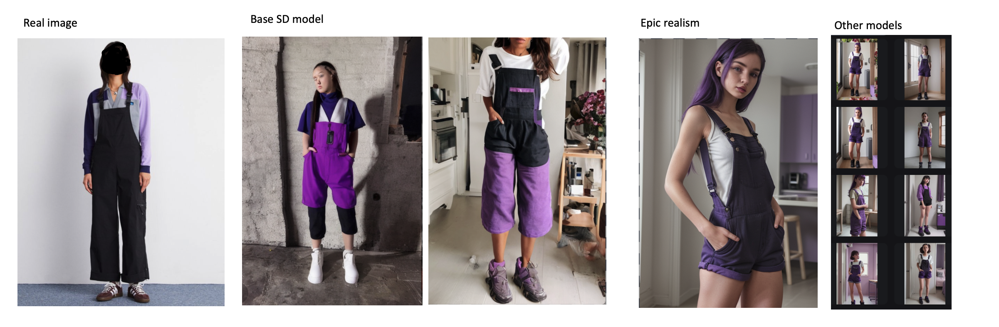

Other models can generate better faces, however they demonstrate something akin to a "mode collapse", since even between different prompts, faces and the general look of people varies very little. Further, different finetune variants appear to be finetuned on top of other finetunes. This makes us believe that the finetuned models only trained on "visually appealing" but narrow datasets.

Therefore, the base stable Diffusion 1.5. model (https://huggingface.co/runwayml/stable-diffusion-v1-5/) is utilized.
